<a href="https://colab.research.google.com/github/Chiaradisanto/Segmentation/blob/main/dicominordine.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [98]:
from google.colab import drive
drive.mount('/gdrive')

Drive already mounted at /gdrive; to attempt to forcibly remount, call drive.mount("/gdrive", force_remount=True).


In [99]:
import os
batch_size=3


In [100]:
%matplotlib inline

import numpy as np # linear algebra
import pandas as pd # 

import os
import scipy.ndimage
import matplotlib.pyplot as plt

from skimage import measure, morphology
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

In [101]:
!pip install pynrrd


In [102]:
!pip install pydicom


In [103]:
import pydicom

In [104]:
from pydicom import dcmread


In [105]:
def get_names(path):
    names = []
    for root, dirnames, filenames in os.walk(path):
        for filename in filenames:
            _, ext = os.path.splitext(filename)
            if ext in ['.dcm']:
                names.append(filename)
    return names

In [106]:
path='/gdrive/MyDrive/TESI/AMPATIENTS/AM-002/20140820-CT Chest_Abdo_Pelvis Contrast/6-HALF 75% 0.84s Cardiac 0.5 CE 75 Percent'

In [107]:

names = sorted(get_names(path))
names


['000000.dcm',
 '000001.dcm',
 '000002.dcm',
 '000003.dcm',
 '000004.dcm',
 '000005.dcm',
 '000006.dcm',
 '000007.dcm',
 '000008.dcm',
 '000009.dcm',
 '000010.dcm',
 '000011.dcm',
 '000012.dcm',
 '000013.dcm',
 '000014.dcm',
 '000015.dcm',
 '000016.dcm',
 '000017.dcm',
 '000018.dcm',
 '000019.dcm',
 '000020.dcm',
 '000021.dcm',
 '000022.dcm',
 '000023.dcm',
 '000024.dcm',
 '000025.dcm',
 '000026.dcm',
 '000027.dcm',
 '000028.dcm',
 '000029.dcm',
 '000030.dcm',
 '000031.dcm',
 '000032.dcm',
 '000033.dcm',
 '000034.dcm',
 '000035.dcm',
 '000036.dcm',
 '000037.dcm',
 '000038.dcm',
 '000039.dcm',
 '000040.dcm',
 '000041.dcm',
 '000042.dcm',
 '000043.dcm',
 '000044.dcm',
 '000045.dcm',
 '000046.dcm',
 '000047.dcm',
 '000048.dcm',
 '000049.dcm',
 '000050.dcm',
 '000051.dcm',
 '000052.dcm',
 '000053.dcm',
 '000054.dcm',
 '000055.dcm',
 '000056.dcm',
 '000057.dcm',
 '000058.dcm',
 '000059.dcm',
 '000060.dcm',
 '000061.dcm',
 '000062.dcm',
 '000063.dcm',
 '000064.dcm',
 '000065.dcm',
 '000066.d

In [108]:
files = []
for x in names:
   
        files.append(pydicom.dcmread(path+'/'+x))

In [109]:
len(files)

160

In [110]:

slices = []
skipcount = 0
for f in files:
    if hasattr(f, 'SliceLocation'):
        slices.append(f)
    else:
        skipcount = skipcount + 1

print("skipped, no SliceLocation: {}".format(skipcount))


skipped, no SliceLocation: 0


In [111]:
len(slices)

160

In [112]:
# ensure they are in the correct order
slices = sorted(slices, key=lambda s: s.SliceLocation, reverse=True)

In [113]:
slices

[Dataset.file_meta -------------------------------
 (0002, 0000) File Meta Information Group Length  UL: 230
 (0002, 0001) File Meta Information Version       OB: b'\x00\x01'
 (0002, 0002) Media Storage SOP Class UID         UI: CT Image Storage
 (0002, 0003) Media Storage SOP Instance UID      UI: 1.3.6.1.4.1.9590.100.1.2.390006875012305203031344945933139827376
 (0002, 0010) Transfer Syntax UID                 UI: Explicit VR Little Endian
 (0002, 0012) Implementation Class UID            UI: 1.3.6.1.4.1.9590.100.1.3.100.9.4
 (0002, 0013) Implementation Version Name         SH: 'MATLAB IPT 9.4'
 (0002, 0016) Source Application Entity Title     AE: 'DicomBrowser'
 -------------------------------------------------
 (0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
 (0008, 0008) Image Type                          CS: ['ORIGINAL', 'PRIMARY', 'AXIAL']
 (0008, 0016) SOP Class UID                       UI: CT Image Storage
 (0008, 0018) SOP Instance UID                    UI

In [114]:
from matplotlib import pyplot as plt

In [115]:
def dicom_HU(scan):
    image = np.stack([s.pixel_array*s.RescaleSlope+s.RescaleIntercept for s in scan],axis=2).astype(np.int16)
    image[image < -1990] = -1000
    print(image.shape)
    plt.figure(figsize=(30, 20))
  

    plt.subplot(151)
    plt.imshow(image[:,:,0], cmap='gray')

    plt.title('Original')
    plt.axis('off')
    return np.array(image)

In [116]:
slices[1]

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 230
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: CT Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.3.6.1.4.1.9590.100.1.2.337691067711818480629309416041976936502
(0002, 0010) Transfer Syntax UID                 UI: Explicit VR Little Endian
(0002, 0012) Implementation Class UID            UI: 1.3.6.1.4.1.9590.100.1.3.100.9.4
(0002, 0013) Implementation Version Name         SH: 'MATLAB IPT 9.4'
(0002, 0016) Source Application Entity Title     AE: 'DicomBrowser'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0008) Image Type                          CS: ['ORIGINAL', 'PRIMARY', 'AXIAL']
(0008, 0016) SOP Class UID                       UI: CT Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.3.6.1.4.1.

In [117]:
patients = os.listdir(path)


(512, 512, 1)


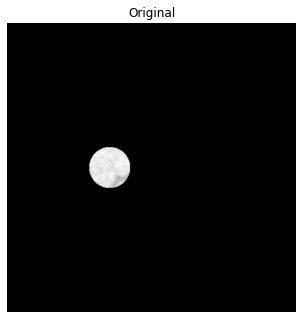

In [127]:
scan1=dicom_HU(slices[159:160])

(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  """


(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 512, 1)
(512, 

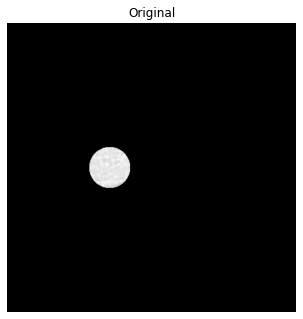

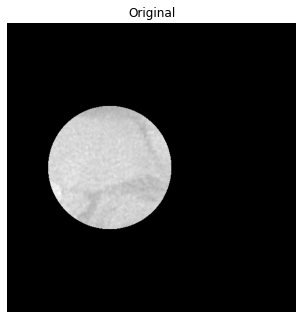

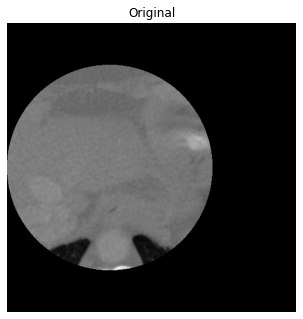

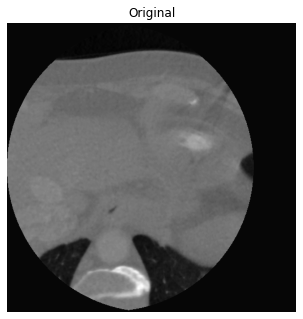

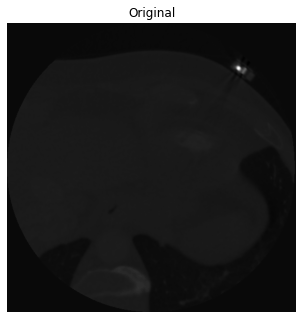

...

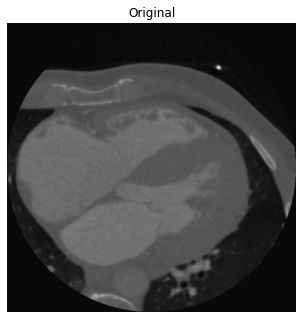

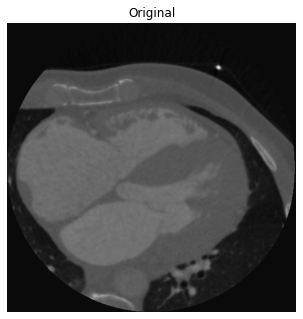

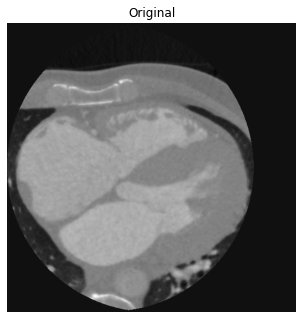

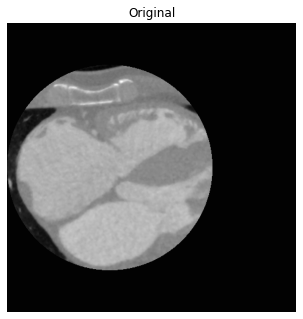

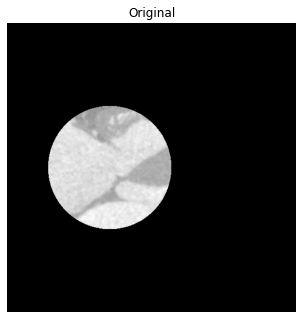

In [130]:
num_slices=160
for i in range(1,num_slices):
  scan1=dicom_HU(slices[i-1:i])

(512, 512, 141)


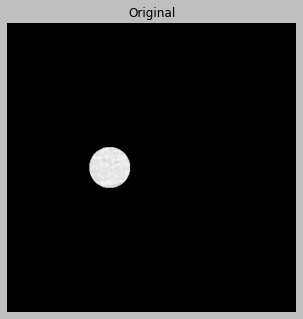

In [74]:
scan1=dicom_HU(slices[:141])

In [ ]:

def U_Net(Image_Size):
    # Take the image size and shape
    input1 = Input(Image_Size)
    
    # Construct the encoder blocks
    skip1, encoder_1 = encoder(input1, 64)
    skip2, encoder_2 = encoder(encoder_1, 64*2)
    skip3, encoder_3 = encoder(encoder_2, 64*4)
    skip4, encoder_4 = encoder(encoder_3, 64*8)
    
    # Preparing the next block
    conv_block = convolution_operation(encoder_4, 64*16)
    
    # Construct the decoder blocks
    decoder_1 = decoder(conv_block, skip4, 64*8)
    decoder_2 = decoder(decoder_1, skip3, 64*4)
    decoder_3 = decoder(decoder_2, skip2, 64*2)
    decoder_4 = decoder(decoder_3, skip1, 64)
    
    out = Conv2D(1, 1, padding="same", activation="sigmoid")(decoder_4)

    model = Model(input1, out)
    return model

In [ ]:
input_shape = (512, 512, 1)
model = U_Net(input_shape)
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 512, 512, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 512, 512, 64  640         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 512, 512, 64  256        ['conv2d[0][0]']                 
 alization)                     )                                                             

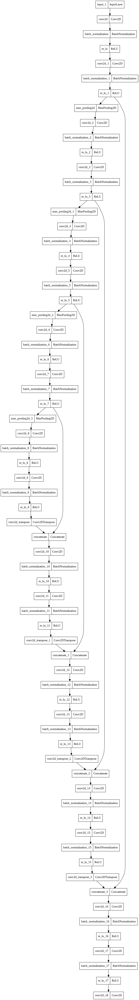

In [ ]:
tf.keras.utils.plot_model(model, "model.png", show_shapes=False, show_dtype=False, show_layer_names=True, rankdir='TB', expand_nested=False, dpi=96)


In [ ]:
from keras import backend as K


In [ ]:

#smooth = 1.
# Dice Coefficient to work with Tensorflow
def dice_coef(y_true, y_pred, smooth=1e-3):
  intersection = K.sum(y_true * y_pred, axis=[1,2,3])
  union = K.sum(y_true, axis=[1,2,3]) + K.sum(y_pred, axis=[1,2,3])
  
  return  K.mean((2. * intersection + smooth)/(union + smooth), axis=0)
def dice_coef_loss(y_true, y_pred):
    return 1.0 -dice_coef(y_true, y_pred, smooth=1e-3)








In [ ]:
from keras import backend as K
smooth=1e-3
from tensorflow.keras.optimizers import Adam



In [ ]:
model.compile( optimizer=Adam(1e-4), loss=[dice_coef_loss], metrics=dice_coef)

In [ ]:
history=model.fit(train_img_gen,
          steps_per_epoch=steps_per_epoch,
          epochs=30,
          verbose=1,
          validation_data=val_img_gen,
          validation_steps=val_steps_per_epoch)

Epoch 1/30
986/986 [==============================] - 2289s 2s/step - loss: 0.8651 - dice_coef: 0.1348 - val_loss: 0.8123 - val_dice_coef: 0.1877
Epoch 2/30
986/986 [==============================] - 789s 800ms/step - loss: 0.8238 - dice_coef: 0.1761 - val_loss: 0.8410 - val_dice_coef: 0.1590
Epoch 3/30
508/986 [==============>...............] - ETA: 6:04 - loss: 0.8173 - dice_coef: 0.1827

In [ ]:

model.compile( optimizer=Adam(1e-5), loss=[dice_coef_loss], metrics=[dice_coef])

callbacks = [
    keras.callbacks.ModelCheckpoint("oxford_segmentation.h5", save_best_only=True)
]

# Train the model, doing validation at the end of each epoch.
epochs = 15
model.fit(train_img_gen, epochs=epochs, validation_data=val_img_gen, callbacks=callbacks)

/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:720: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:728: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


Epoch 1/15
      2/Unknown - 158s 76s/step - loss: -0.3674 - dice_coef: 0.3674